In [3]:
from __future__ import print_function, division
#Allows relative imports
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
#imports from files
from src.preprocessing import *
from src.pickling import *
from src.torch_util import load_model
from src.embedding_visualisation import *
from src.repertoire_dataset import EmersonRepertoire_Dataset, load_train_test_repertoire
from vae_cel.DeepRC_VAE import *
from vae_cel.vae_cel import *
from vae_cel.vae_cel_loss import *
from vae_cel.vae_cel_train import * 

import pandas as pd 
import numpy as np
import math

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import BatchSampler, RandomSampler, SequentialSampler
#checking gpu status
if torch.cuda.is_available():
    device = torch.device('cuda')
    print("Using : {}".format(device))
else:
    device = torch.device('cpu')
    print("Using : {}".format(device))
    
#Plot and stuff
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi']= 200
sns.set_style('darkgrid')


# Ignore warnings
import warnings
warnings.filterwarnings("ignore")
    
%load_ext autoreload
%autoreload 2

Using : cuda


Text(0.5, 1.0, 'VAL Loss for hyperbolic annealing')

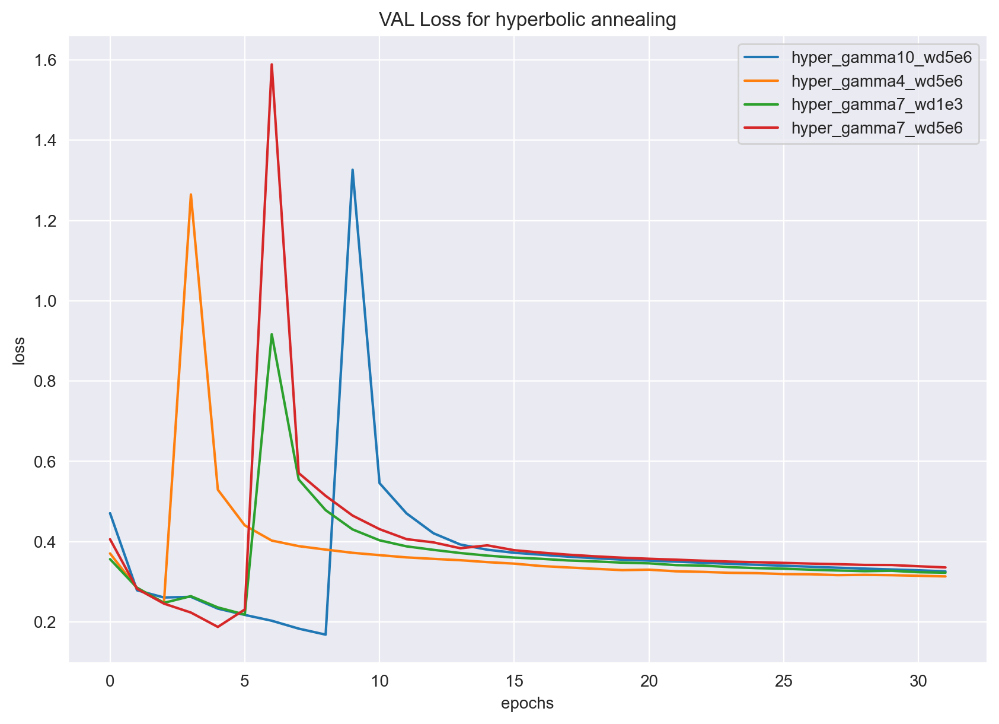

In [2]:
loss_dict_comparison = {}
for di in [os.path.join('../output/AnotherRegimeComparison', x) for x in os.listdir('../output/AnotherRegimeComparison')]:
    fn = [x for x in os.listdir(di) if '.pkl' in x][0]
    loss_dict_comparison[os.path.basename(di)] = load_pkl(os.path.join(di,fn))['val']
plt.figure(figsize = (10,7))
for k in loss_dict_comparison.keys():
    plt.plot(loss_dict_comparison[k], label = k)
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('VAL Loss for hyperbolic annealing')

In [36]:
print('hyper_gamma7_wd1e-3', loss_dict['hyper_gamma7_wd1e3'][-3:])
print('hyper_gamma7_wd5e-6', loss_dict['hyper_gamma7_wd5e6'][-3:])
print('hyper_gamma4_wd5e-6', loss_dict['hyper_gamma4_wd5e6'][-3:])

hyper_gamma7_wd1e-3 [0.32727161049842834, 0.3237007965401905, 0.3224408415759482]
hyper_gamma7_wd5e-6 [0.34165463069590124, 0.3385106390569268, 0.33563327280486505]
hyper_gamma4_wd5e-6 [0.3162686374129319, 0.31486576795578003, 0.3132526191269479]


Text(0.5, 1.0, 'VAL Loss for annealing comparison')

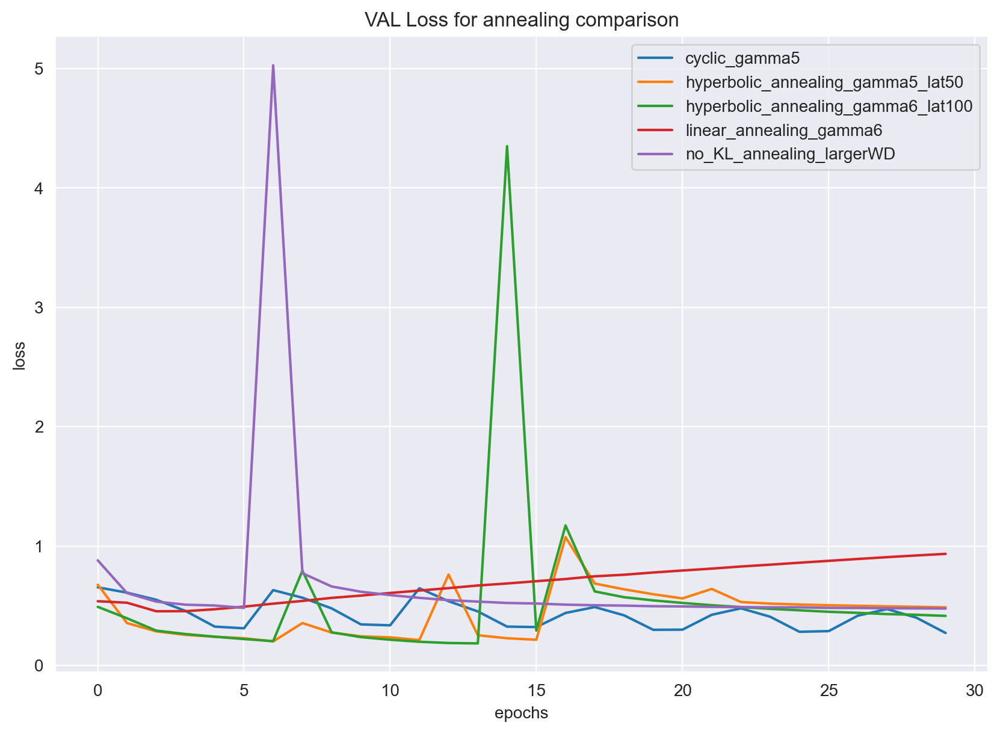

In [3]:
tmp = {}
dir_ = '../output/VAE_CEL_regime_comparison/'
for di in [os.path.join(dir_, x) for x in os.listdir(dir_)]:
    fn = [x for x in os.listdir(di) if '.pkl' in x][0]
    tmp[os.path.basename(di)] = load_pkl(os.path.join(di,fn))['val']
plt.figure(figsize = (10,7))
for k in tmp.keys():
    plt.plot(tmp[k], label = k)
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('VAL Loss for annealing comparison')
#plt.ylim([0,1])

Text(0.5, 1.0, 'VAL Loss for annealing comparison')

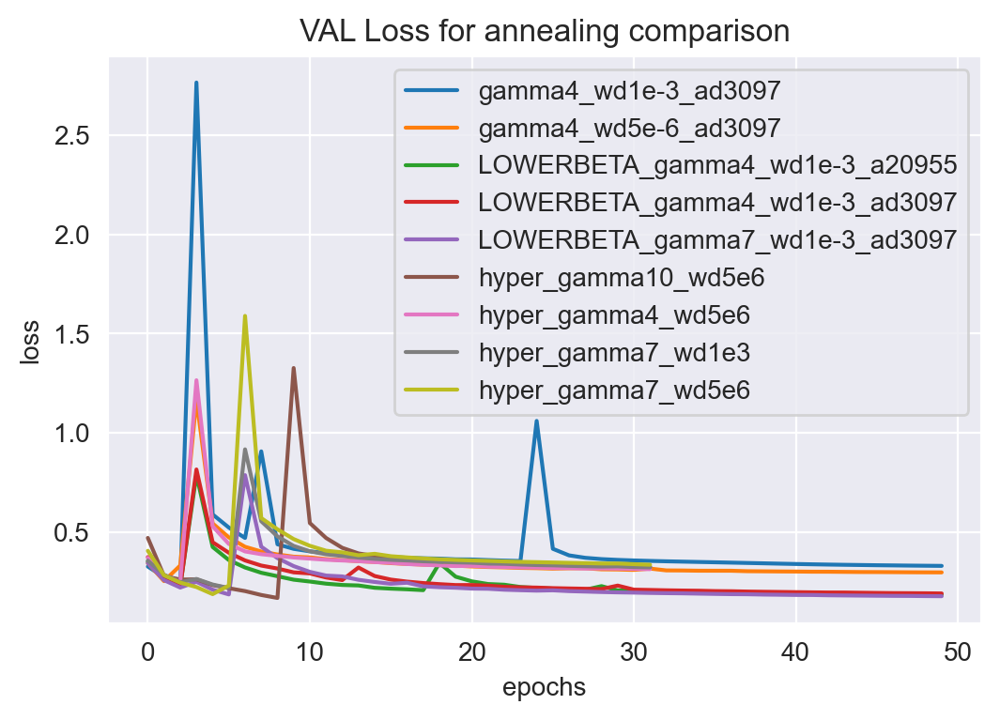

In [13]:

for d in [loss_dict, loss_dict_comparison]:
    for k in d.keys():
        plt.plot(d[k], label = k)
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('VAL Loss for annealing comparison')
#plt.ylim([0,1])

Text(0.5, 1.0, 'VAL Loss for hyperbolic annealing')

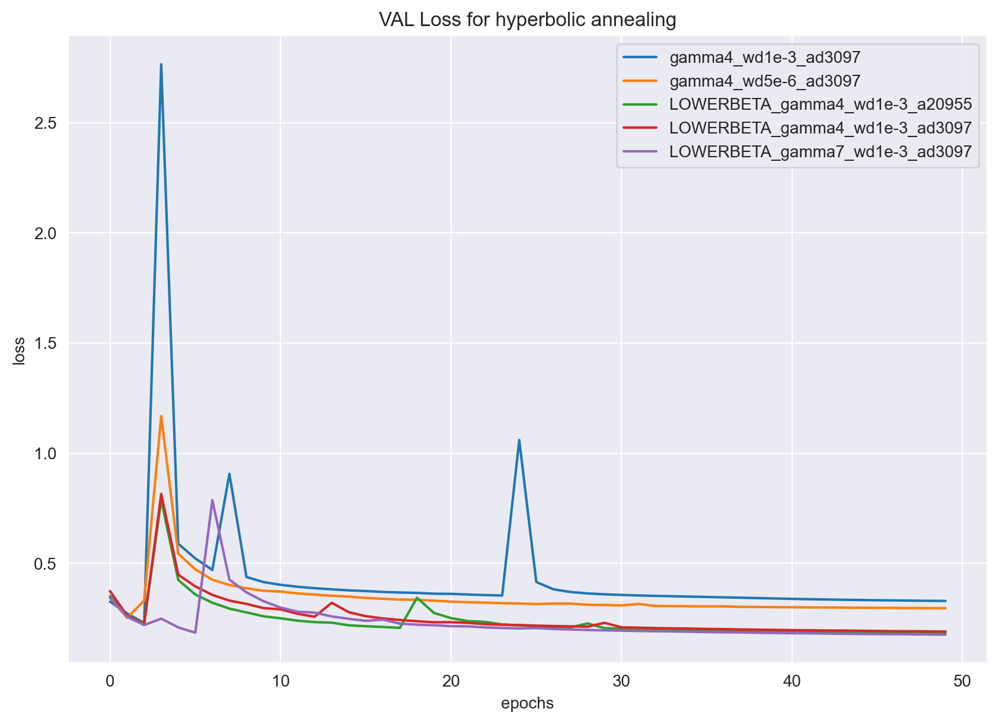

In [4]:
loss_dict = {}
for di in [os.path.join('../output/HyperbolicTuning/', x) for x in os.listdir('../output/HyperbolicTuning/')]:
    fn = [x for x in os.listdir(di) if '.pkl' in x][0]
    loss_dict[os.path.basename(di)] = load_pkl(os.path.join(di,fn))['val']
plt.figure(figsize = (10,7))
for k in loss_dict.keys():
    plt.plot(loss_dict[k], label = k)
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('VAL Loss for hyperbolic annealing')

In [8]:
for k in list(loss_dict.keys())[2:]:
    print(f'key :{k}, {loss_dict[k][-3:]}')
    
# best is LOWERBETA_gamma7_wd1e-3_ad3097

key :LOWERBETA_gamma4_wd1e-3_a20955, [0.1867214233978935, 0.18580787110587824, 0.18527488054140753]
key :LOWERBETA_gamma4_wd1e-3_ad3097, [0.19227346745522125, 0.1917741081636885, 0.19094779245231464]
key :LOWERBETA_gamma7_wd1e-3_ad3097, [0.17843951803186667, 0.17760774719974268, 0.17700887439043625]


In [4]:
model = VAE_cel(seq_len = 23, aa_dim = 25, latent_dim = 100, act = nn.SELU())
tmp = torch.load('../output/AnotherRegimeComparison/hyper_gamma7_wd1e3/BEST_VAE_tune-weighted0.5_latent100_Pad-before_Annealing-hyper-gamma7.0.pth.tar')
model.load_state_dict(tmp['state_dict'])
model.to(device);
model.eval();


In [5]:
from src.datasets import *
test_dataset = pd.read_csv('../training_data_new/mixed_vj_dataset/mixed_vj_test.csv')

In [9]:
# Not sure which weights these are, probly one of the ones without beta = 0.5

test_model(model, VAELoss_cel(beta = 1), test_dataset, 2**14, 23, 0.5, 'before', True, False, 'cuda')
#model with 25% hamming seq loss
test_decode(model, test_dataset, 10, 23, 0.5, 'before', True)

test set:   0%|          | 0/62 [00:00<?, ?it/s]

,hamming_seq_padded,hamming_sequence,accuracy_V,accuracy_J,Criterion_loss
mean,15.97945,24.890857,0.999088,0.999687,8.192935
var,0.003495,0.007229,0.0,0.0,0.000206


### Here Latent VIZ with best 50 epochs trained model

In [5]:
from src.embedding_visualisation import * 
from src.datasets import *
test_dataset = pd.read_csv('../training_data_new/mixed_vj_dataset/mixed_vj_test.csv')

em = test_dataset.query('db=="emerson_b1"').sample(100000)
model = VAE_cel(seq_len = 23, aa_dim = 25, latent_dim = 100, act = nn.SELU())
path = '../output/HyperbolicTuning/LOWERBETA_gamma7_wd1e-3_ad3097/'
model = load_model(model, os.path.join(path, [x for x in os.listdir(path) if 'BEST' in x][0]))


Model succesfully loaded from ../output/HyperbolicTuning/LOWERBETA_gamma7_wd1e-3_ad3097/BEST_VAE_tune-weighted0.5_latent100_Pad-before_Annealing-hyper-gamma7.0.pth.tar:
	epoch: 49


In [6]:
embedding_df = get_embedding_df(model, em[['amino_acid','v_family','j_family']].values, 'cuda')

  0%|          | 0/25 [00:00<?, ?it/s]

In [8]:
columns = ['sequence','v','j'] + ['z_'+str(x) for x in list(range(model.lat_dim))]
embedding_df = embedding_df.reindex(columns=columns)
z_cols = [z for z in embedding_df.columns if z.startswith('z')]
sub = embedding_df.sample(25000)

mpl.rcParams['figure.dpi']= 180
sns.set_style('darkgrid')
sns.set_palette('seismic_r')

In [ ]:
for cols in tqdm(list(chunks(z_cols, 10)), desc = 'plotting batch'):
    plot_latent(sub, cols, hue='v')

In [46]:
emerson = pd.read_csv('../training_data_new/emerson_raw/batch1/emerson_batch1_626hla_parsed_tagged.tsv',
            sep = '\t', usecols = ['amino_acid','frequency', 'v_family', 'j_family', 'filename', 'pred_cmv', 'true_cmv'])
sample_tags = pd.read_csv('../training_data_new/emerson_raw/batch1/emerson_batch1_sampletags.tsv',
                         sep = '\t')

In [30]:
sample_tags.groupby('class').agg(count = ('class','count'))\
           .sort_values('count', ascending =False).head(15)

,count
class,
A01-A02-B08-B51,6
A01-A02-B08-B44,6
A01-B08,5
A02-A03-B07-B27,5
A01-A03-B08-B35,4
A01-A03-B07-B08,4
A01-A02-B08-B27,4
A01-A02-B08-B62,4
A02-A03-B07-B44,3


In [47]:
fn1 = sample_tags.query('label == "A01-A26-B08-B38"').filename.values
fn2 = sample_tags.query('label == "A03-A29-B07-B44"').filename.values
sub = emerson.query('filename in @fn1 or filename in @fn2')
sub['label'] = sub.apply(lambda x:"A01-A26-B08-B38" if x['filename'] in fn1 else "A03-A29-B07-B44", axis=1)
sub = sub.query('amino_acid.str.len()<=23')

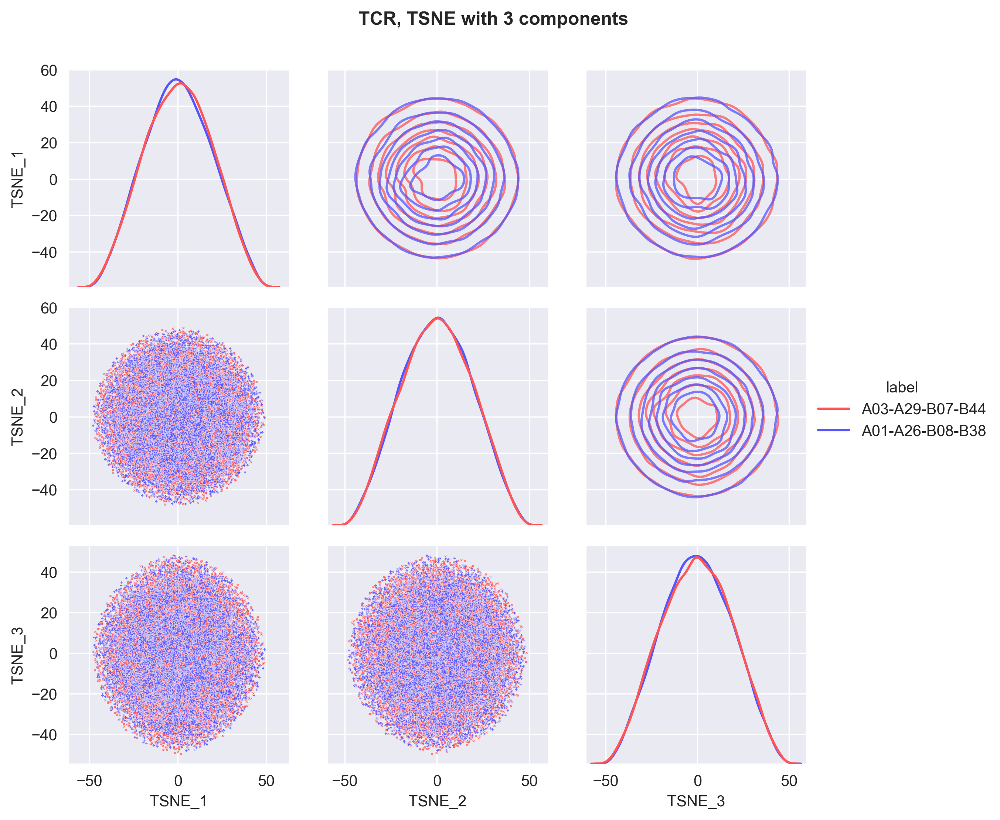

In [63]:
top = get_topk(sub, 1000, verbose = False)
df_reduc = get_reduc(top, model, 'TSNE', 3)
plot_reduc(df_reduc, 'label', '','TSNE','seismic_r',True)

	 Onehot-encoding.
	 Embedding 30000 sequences.
	 Fitting UMAP.
	 Waiting on plotting.


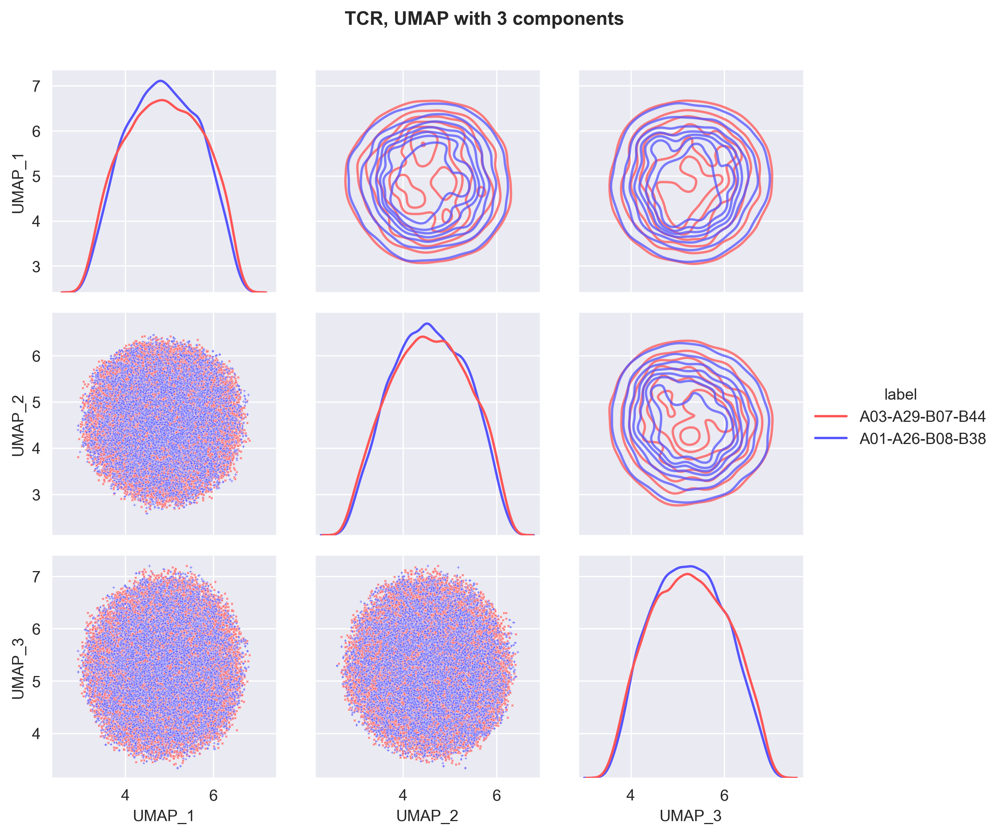

In [64]:
df_reduc = get_reduc(df_reduc, model, 'UMAP', 3)
plot_reduc(df_reduc, 'label', '','UMAP','seismic_r',True)

In [69]:
b2 = pd.read_csv(os.path.join('../training_data_new/emerson_raw/batch2/','emerson_batch2_filtered_length_vdj.tsv'),
           sep = '\t')

In [77]:
fs = np.random.choice(b2.filename.unique(), 10)

In [80]:
b2_top = get_topk(b2.query('filename in @fs'),
                  2500, verbose = False)
df_reduc_b2 = get_reduc(b2_top, model, 'UMAP', 3)


	 Getting the top 2500
	 Onehot-encoding.


KeyboardInterrupt: 

In [86]:
fn_true  = sample_tags.query('true_cmv=="1"').sample(50).filename.values
fn_false = sample_tags.query('true_cmv=="0"').sample(50).filename.values
sub = emerson.query('filename in @fn_true or filename in @fn_false')
sub['CMV'] = sub.apply(lambda x: True if x['filename'] in fn1 else False, axis=1)
sub = sub.query('amino_acid.str.len()>10 and amino_acid.str.len()<=23')
top = get_topk(sub, 1000, verbose = False)

df_reduc = get_reduc(top, model, 'TSNE', 3)
plot_reduc(df_reduc, 'CMV', 'Comparison of top 1000 sequences for 100 patients (50 CMV+, 50 CMV-)',
           'TSNE','seismic_r',True)

df_reduc = get_reduc(top, model, 'UMAP', 3)
plot_reduc(df_reduc, 'CMV', 'Comparison of top 1000 sequences for 100 patients (50 CMV+, 50 CMV-)',
           'UMAP','seismic_r',True)

	 Getting the top 1000
	 Onehot-encoding.
	 Embedding 100000 sequences.
	 Fitting TSNE.
	 Waiting on plotting.


NameError: name 'palette' is not defined

In [99]:
df_reduc.true_cmv = df_reduc.true_cmv.astype(int)

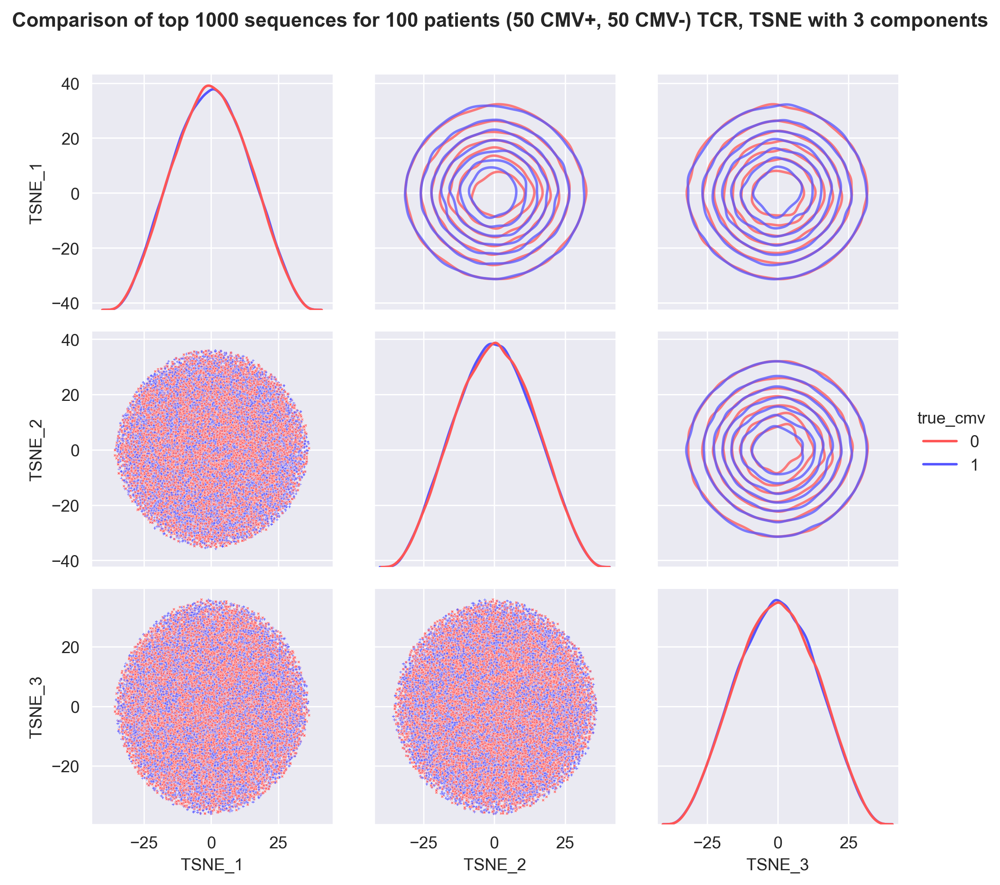

In [102]:
sns.set_palette('seismic_r', n_colors = 2)
plot_reduc(df_reduc, 'true_cmv', 'Comparison of top 1000 sequences for 100 patients (50 CMV+, 50 CMV-)',
           'TSNE','seismic_r',True)

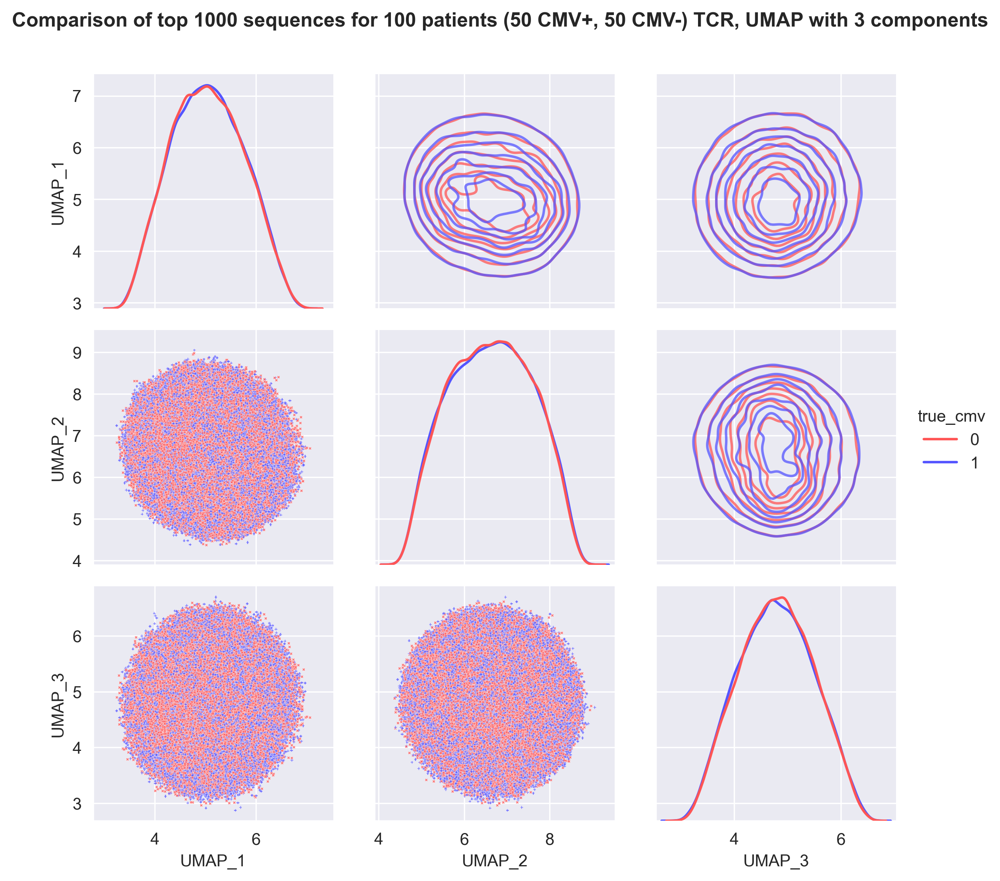

In [104]:
df_reduc = get_reduc(top, model, 'UMAP', 3)
plot_reduc(df_reduc, 'true_cmv', 'Comparison of top 1000 sequences for 100 patients (50 CMV+, 50 CMV-)',
           'UMAP','seismic_r',True)

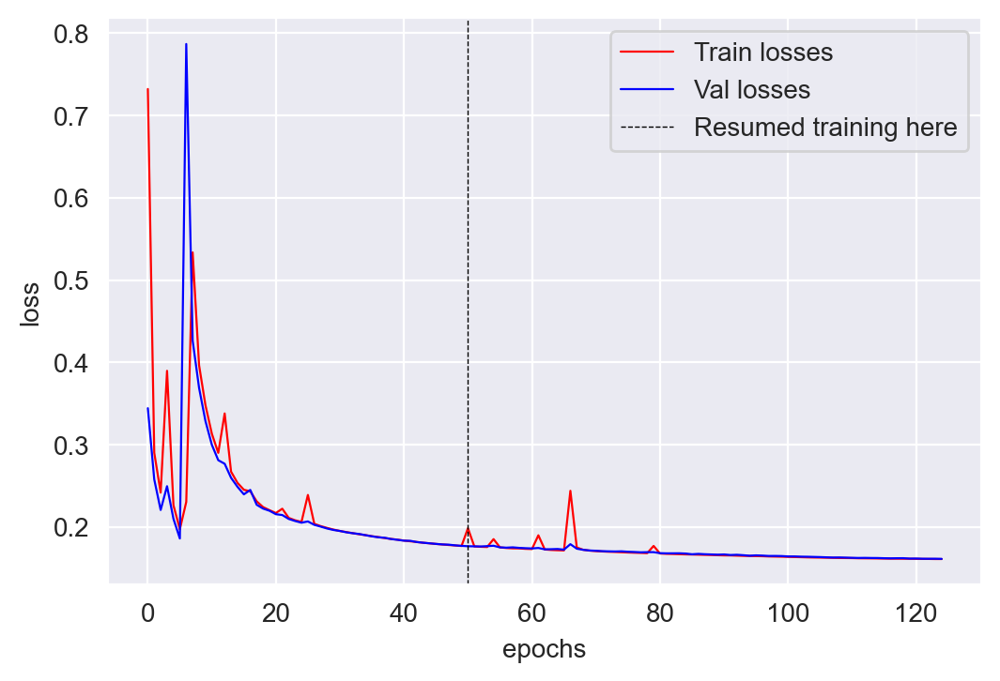

In [15]:
start = load_pkl('../output/HyperbolicTuning/LOWERBETA_gamma7_wd1e-3_ad3097/VAE_tune-weighted0.5_latent100_Pad-before_Annealing-hyper-gamma7.0_losses.pkl')
end = load_pkl('../output/HyperbolicContinueTraining/LOWERBETA_DirectlyMax/VAE_tune-weighted0.5_latent100_Pad-before_Annealing-None-gamma1.0_losses.pkl')
start['train'] += end['train']
start['val'] += end['val']

plt.plot(start['train'], 'r-',lw=.8, label = 'Train losses')
plt.plot(start['val'], 'b-',lw=.8, label = 'Val losses')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.axvline(50, color='k',linestyle = '--', 
            linewidth=0.5, label = 'Resumed training here')
plt.legend()

In [20]:
from src.torch_util import *
model = VAE_cel(latent_dim = 100, aa_dim = 25)
model = load_model(model, '../output/HyperbolicContinueTraining/LOWERBETA_DirectlyMax/BEST_VAE_tune-weighted0.5_latent100_Pad-before_Annealing-None-gamma1.0.pth.tar')
model.to(device);

Model succesfully loaded from ../output/HyperbolicContinueTraining/LOWERBETA_DirectlyMax/BEST_VAE_tune-weighted0.5_latent100_Pad-before_Annealing-None-gamma1.0.pth.tar:
	epoch: 74


In [24]:
vdjdb = pd.read_csv('../vdjdb.txt', sep ='\t')
vdjdb.columns

Index(['complex.id', 'gene', 'cdr3', 'v.segm', 'j.segm', 'species', 'mhc.a',
       'mhc.b', 'mhc.class', 'antigen.epitope', 'antigen.gene',
       'antigen.species', 'reference.id', 'method', 'meta', 'cdr3fix',
       'vdjdb.score', 'web.method', 'web.method.seq', 'web.cdr3fix.nc',
       'web.cdr3fix.unmp'],
      dtype='object')